In [1]:
# Visualisation des données
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd
import seaborn as sns

# Pré-traitement des données
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA

# Pour tester les performances des modèles utilisés
from sklearn import metrics

# Classification
from sklearn.model_selection import GridSearchCV
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.svm import SVC

# Selection des paramètres 
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2, mutual_info_classif, f_classif, RFE

In [2]:
data_cancer = pd.read_csv('./data.csv')
data_cancer.head()

,id,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
0,842302,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,...,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890,NaN
1,842517,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,...,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902,NaN
2,84300903,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,...,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758,NaN
3,84348301,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,...,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300,NaN
4,84358402,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,...,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678,NaN


In [3]:
data_cancer.describe()

,id,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst,Unnamed: 32
count,5.690000e+02,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,0.0
mean,3.037183e+07,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,...,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946,NaN
std,1.250206e+08,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,...,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061,NaN
min,8.670000e+03,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,...,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040,NaN
25%,8.692180e+05,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,...,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460,NaN
50%,9.060240e+05,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,...,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040,NaN
75%,8.813129e+06,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,...,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080,NaN
max,9.113205e+08,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,...,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500,NaN


In [4]:
data_cancer.columns

Index(['id', 'diagnosis', 'radius_mean', 'texture_mean', 'perimeter_mean',
       'area_mean', 'smoothness_mean', 'compactness_mean', 'concavity_mean',
       'concave points_mean', 'symmetry_mean', 'fractal_dimension_mean',
       'radius_se', 'texture_se', 'perimeter_se', 'area_se', 'smoothness_se',
       'compactness_se', 'concavity_se', 'concave points_se', 'symmetry_se',
       'fractal_dimension_se', 'radius_worst', 'texture_worst',
       'perimeter_worst', 'area_worst', 'smoothness_worst',
       'compactness_worst', 'concavity_worst', 'concave points_worst',
       'symmetry_worst', 'fractal_dimension_worst', 'Unnamed: 32'],
      dtype='object')

In [4]:
data_cancer.drop(['Unnamed: 32', 'id'], inplace=True, axis = 1)
data_cancer.head()

,diagnosis,radius_mean,texture_mean,perimeter_mean,area_mean,smoothness_mean,compactness_mean,concavity_mean,concave points_mean,symmetry_mean,...,radius_worst,texture_worst,perimeter_worst,area_worst,smoothness_worst,compactness_worst,concavity_worst,concave points_worst,symmetry_worst,fractal_dimension_worst
0,M,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.3001,0.14710,0.2419,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,M,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.0869,0.07017,0.1812,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,M,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.1974,0.12790,0.2069,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,M,11.42,20.38,77.58,386.1,0.14250,0.28390,0.2414,0.10520,0.2597,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,M,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.1980,0.10430,0.1809,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678


Text(0.5, 1.0, "Matrice d'autocorrélation des données")

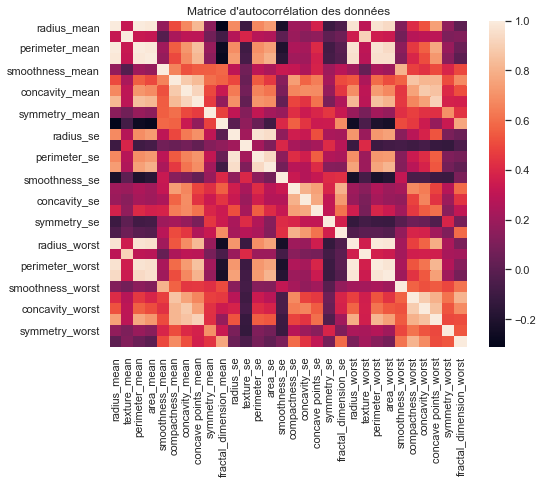

In [8]:
sns.set_theme(style="darkgrid")
plt.figure(figsize=(8,6))
sns.heatmap(data_cancer.corr())
plt.title("Matrice d'autocorrélation des données")

Comme on pouvait le penser au préalable, il y a plusieurs variables qui sont corrélées et par conséquent elles nous amènent aucune information en plus. Par exemple entre le rayon, la surface et le perimètre, c'est clair qu'il y a une relation directe

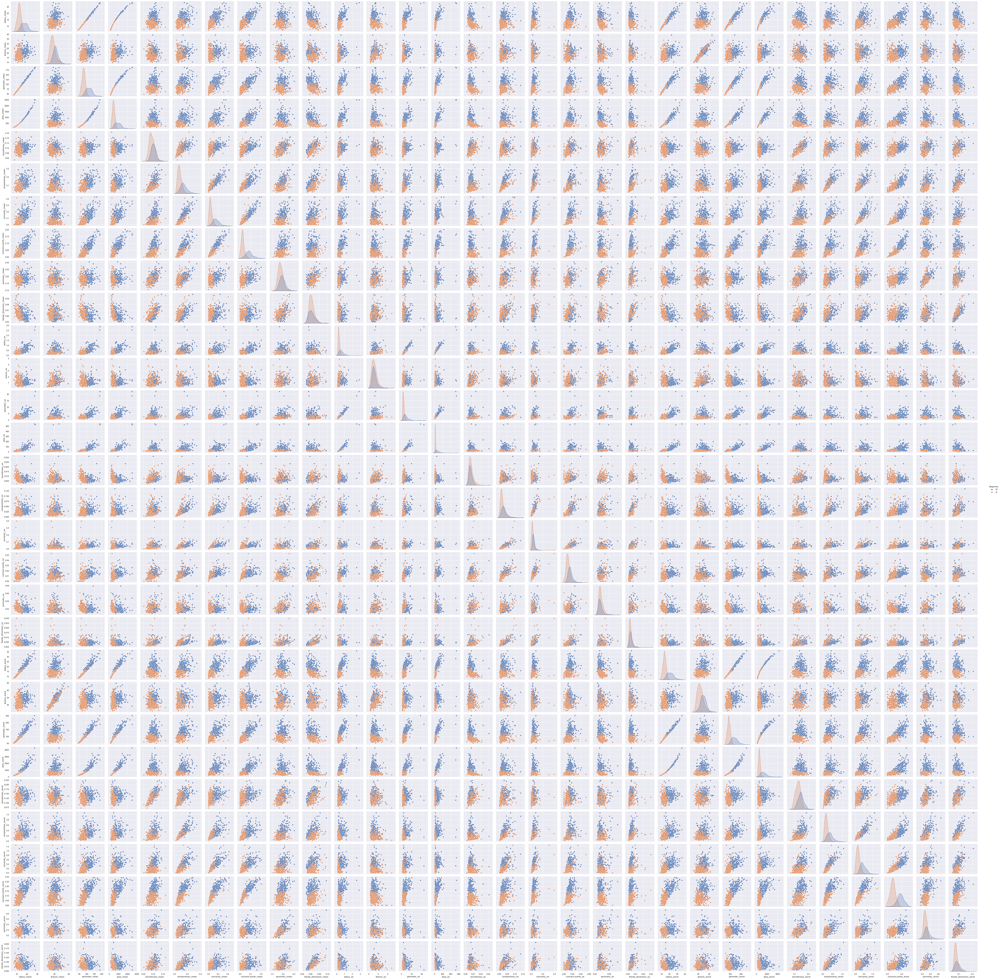

In [11]:
sns.pairplot(data_cancer, hue='diagnosis')

C'est un problème où la diminution des paramètres peut énormément aider à améliorer la classification et donc on va tenter plusieurs méthodes :
- Une première partie en utilisant toutes les variables disponibles
- En utilisant une analyse en composantes principales assurant une décorrélation de toutes les variables
- En utilisant des méthodes de sélections de paramètres : 
    - En utilisant des algorithmes ayant directement des méthodes de sélection embarquées (Random Forrest)
    - Basé sur des calculs statistiques de corrélation et carré Chi
    - Utilisation de Recursive Feature Elimination
## 1. Classification sans réduction de dimensions
### a) Préparation des données
- Normalisation des données
- Subdivision en deux sous groupes : entraînement et test

In [5]:
data_cancer_features = data_cancer.copy()
etiq = data_cancer['diagnosis']
data_cancer_features.drop("diagnosis", axis=1, inplace=True)
data_cancer_scaled = StandardScaler().fit_transform(data_cancer_features)
data_cancer_scaled = pd.DataFrame(data_cancer_scaled)
data_cancer_scaled

,0,1,2,3,4,5,6,7,8,9,...,20,21,22,23,24,25,26,27,28,29
0,1.097064,-2.073335,1.269934,0.984375,1.568466,3.283515,2.652874,2.532475,2.217515,2.255747,...,1.886690,-1.359293,2.303601,2.001237,1.307686,2.616665,2.109526,2.296076,2.750622,1.937015
1,1.829821,-0.353632,1.685955,1.908708,-0.826962,-0.487072,-0.023846,0.548144,0.001392,-0.868652,...,1.805927,-0.369203,1.535126,1.890489,-0.375612,-0.430444,-0.146749,1.087084,-0.243890,0.281190
2,1.579888,0.456187,1.566503,1.558884,0.942210,1.052926,1.363478,2.037231,0.939685,-0.398008,...,1.511870,-0.023974,1.347475,1.456285,0.527407,1.082932,0.854974,1.955000,1.152255,0.201391
3,-0.768909,0.253732,-0.592687,-0.764464,3.283553,3.402909,1.915897,1.451707,2.867383,4.910919,...,-0.281464,0.133984,-0.249939,-0.550021,3.394275,3.893397,1.989588,2.175786,6.046041,4.935010
4,1.750297,-1.151816,1.776573,1.826229,0.280372,0.539340,1.371011,1.428493,-0.009560,-0.562450,...,1.298575,-1.466770,1.338539,1.220724,0.220556,-0.313395,0.613179,0.729259,-0.868353,-0.397100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
564,2.110995,0.721473,2.060786,2.343856,1.041842,0.219060,1.947285,2.320965,-0.312589,-0.931027,...,1.901185,0.117700,1.752563,2.015301,0.378365,-0.273318,0.664512,1.629151,-1.360158,-0.709091
565,1.704854,2.085134,1.615931,1.723842,0.102458,-0.017833,0.693043,1.263669,-0.217664,-1.058611,...,1.536720,2.047399,1.421940,1.494959,-0.691230,-0.394820,0.236573,0.733827,-0.531855,-0.973978
566,0.702284,2.045574,0.672676,0.577953,-0.840484,-0.038680,0.046588,0.105777,-0.809117,-0.895587,...,0.561361,1.374854,0.579001,0.427906,-0.809587,0.350735,0.326767,0.414069,-1.104549,-0.318409
567,1.838341,2.336457,1.982524,1.735218,1.525767,3.272144,3.296944,2.658866,2.137194,1.043695,...,1.961239,2.237926,2.303601,1.653171,1.430427,3.904848,3.197605,2.289985,1.919083,2.219635


In [6]:
etiq

0      M
1      M
2      M
3      M
4      M
      ..
564    M
565    M
566    M
567    M
568    B
Name: diagnosis, Length: 569, dtype: object

In [6]:
fv_train, fv_test, etiq_train, etiq_test = train_test_split(data_cancer_features, etiq, test_size=0.3,random_state=23)

### b) KNN

In [7]:
parameters = {'n_neighbors':np.arange(1,20,1), 'p' : np.arange(1,3,1)}
knn=KNeighborsClassifier()
clf = GridSearchCV(knn, parameters)
clf.fit(fv_train,etiq_train)
knn=KNeighborsClassifier(**clf.best_params_)
knn.fit(fv_train,etiq_train)

KNeighborsClassifier(n_neighbors=7, p=1)

In [11]:
yknn=knn.predict(fv_test)
print("Taux de précision KNN lors des tests : ",metrics.accuracy_score(etiq_test, yknn))
print("F1-score KNN lors des tests : ", metrics.f1_score(etiq_test, yknn, average='weighted'))
print(metrics.classification_report(etiq_test, yknn))

Taux de précision KNN lors des tests :  0.9415204678362573
F1-score KNN lors des tests :  0.9410934190916933
              precision    recall  f1-score   support

           B       0.94      0.97      0.95       108
           M       0.95      0.89      0.92        63

    accuracy                           0.94       171
   macro avg       0.94      0.93      0.94       171
weighted avg       0.94      0.94      0.94       171



<AxesSubplot:>

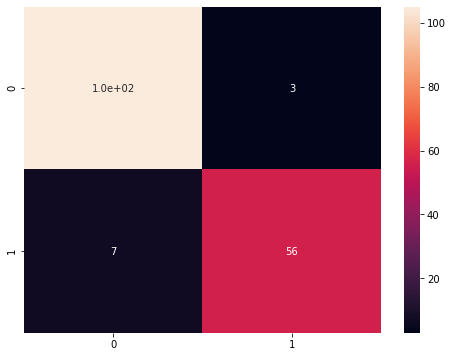

In [10]:
plt.figure(figsize=(8,6))
sns.heatmap(metrics.confusion_matrix(etiq_test, yknn), annot=True, annot_kws={"size": 10})

### c) SVM

In [17]:
parameters = {'degree':np.arange(1,20,1)}
svm=SVC(gamma='scale', class_weight='balanced')
clf = GridSearchCV(svm, parameters)
clf.fit(fv_train,etiq_train)
svm=SVC(**clf.best_params_)
svm.fit(fv_train,etiq_train)
ysvm=svm.predict(fv_test)
print("Taux de précision SVM lors des tests : ",metrics.accuracy_score(etiq_test, ysvm))
print("F1-score SVM lors des tests : ",metrics.f1_score(etiq_test, ysvm, average='weighted'))

Taux de précision SVM lors des tests :  0.9415204678362573
F1-score SVM lors des tests :  0.9405823881738243


<AxesSubplot:>

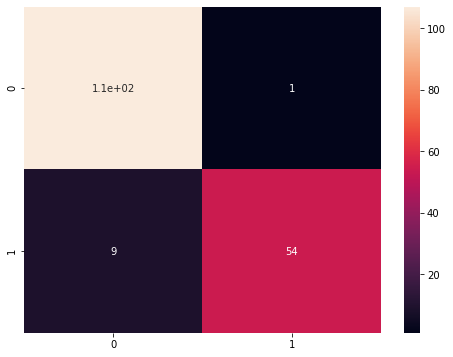

In [19]:
plt.figure(figsize=(8,6))
sns.heatmap(metrics.confusion_matrix(etiq_test, ysvm), annot=True, annot_kws={"size": 10})

### d) MLP

In [33]:
mlp = MLPClassifier(solver='lbfgs', alpha=1e-4, activation='tanh', max_iter = 1000 , hidden_layer_sizes=(70,70,), random_state=0).fit(fv_train,etiq_train)
ymlp = mlp.predict(fv_test)
print("Taux de précision MLP lors des tests : ",metrics.accuracy_score(etiq_test, ymlp))
print("F1-score MLP lors des tests : ",metrics.f1_score(etiq_test, ymlp, average='weighted'))

Taux de précision MLP lors des tests :  0.9415204678362573
F1-score MLP lors des tests :  0.9415204678362573


C:\Users\pc\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:500: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


<AxesSubplot:>

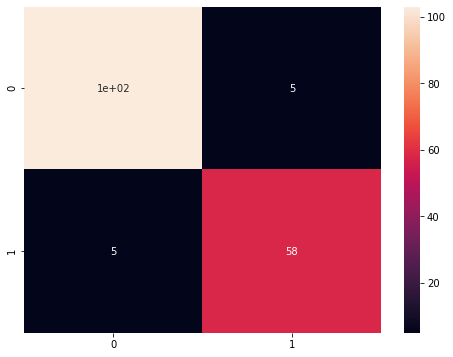

In [34]:
plt.figure(figsize=(8,6))
sns.heatmap(metrics.confusion_matrix(etiq_test, ymlp), annot=True, annot_kws={"size": 10})

On fait un rapide comparatif des 3 matrices de confusions

Text(0.5, 1.0, 'Avec le MLP')

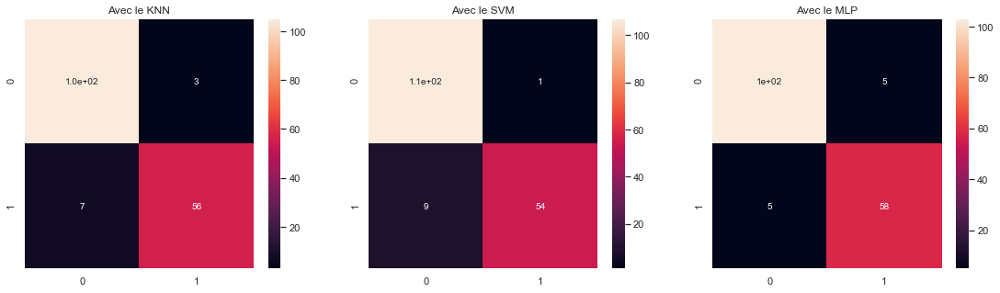

In [57]:
sns.set_theme(style="darkgrid")
plt.figure(figsize=(19,5))
plt.title("Matrices de confusion avec les variables originales")
plt.subplot(1,3,1)
sns.heatmap(metrics.confusion_matrix(etiq_test, yknn), annot=True, annot_kws={"size": 10})
plt.title("Avec le KNN")
plt.subplot(1,3,2)
sns.heatmap(metrics.confusion_matrix(etiq_test, ysvm), annot=True, annot_kws={"size": 10})
plt.title("Avec le SVM")
plt.subplot(1,3,3)
sns.heatmap(metrics.confusion_matrix(etiq_test, ymlp), annot=True, annot_kws={"size": 10})
plt.title("Avec le MLP")

Alors comme on l'a vu avec les 3 modèles précédents on a d'excellent résultats avec dans l'ensemble un résultat d'environ 94% ce qui est très bien. On va voir si on peut améliorer ce résultat avec une sélection des paramètres les plus utiles
## Classification en utilisant les composantes principales (application PCA)
On réutilise les même algorithmes en comparant alors avec et sans utilisation d'analyse en composantes principales
### a) Calcul des composantes principales et préparation des données

In [43]:
pca7 = PCA(n_components=7)
pca_cancer = pca7.fit_transform(data_cancer_scaled)
pca_cancer_df = pd.DataFrame(data = pca_cancer
             , columns = ['CP_1', 'CP_2', 'CP_3', 'CP_4', 'CP_5', 'CP_6', 'CP_7'])
pca_cancer_df.head()

print('Variance exprimée par composante principale : {}'.format(pca7.explained_variance_ratio_))
print("Indiquant alors qu'on a au total : {}".format(sum(pca7.explained_variance_ratio_)*100),"% exprimée à travers ces 7 composantes")

Variance exprimée par composante principale : [0.44272026 0.18971182 0.09393163 0.06602135 0.05495768 0.04024522
 0.02250734]
Indiquant alors qu'on a au total : 91.00953006374436 % exprimée à travers ces 7 composantes


Comme on peut l'observer on est passé de 30 variables à 7 variables en gardant nénamoins 91% de l'information disponible dans les variables. On verra si ça suffit pour avoir de bon résultat, sinon on ajoutera d'autres composantes principales. On analyse la matrice de corrélation des données pour voir qu'on n'a pas une corrélation entre les données comme vu précédement avec les variables de base

Text(0.5, 1.0, "Matrice d'autocorrélation des données")

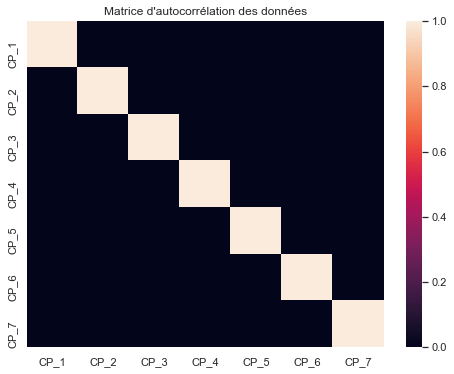

In [44]:
sns.set_theme(style="darkgrid")
plt.figure(figsize=(8,6))
sns.heatmap(pca_cancer_df.corr())
plt.title("Matrice d'autocorrélation des données")

Aucune corrélation entre les composantes principales, on prépare maintenant les données pour la classification

In [45]:
fv_train_pca, fv_test_pca, etiq_train, etiq_test = train_test_split(pca_cancer_df, etiq, test_size=0.3,random_state=23)

### b) KNN

Taux de précision KNN lors des tests :  0.9707602339181286
F1-score KNN lors des tests :  0.970807351651423


<AxesSubplot:>

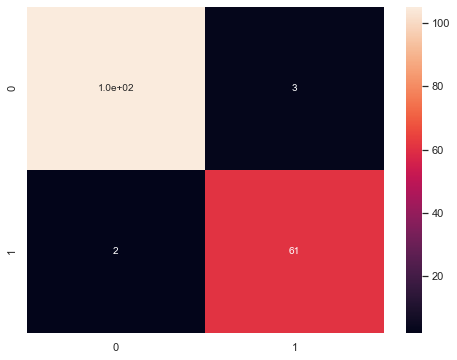

In [46]:
parameters = {'n_neighbors':np.arange(1,20,1), 'p' : np.arange(1,3,1)}
knn_pca=KNeighborsClassifier()
clf = GridSearchCV(knn_pca, parameters)
clf.fit(fv_train_pca,etiq_train)
knn_pca=KNeighborsClassifier(**clf.best_params_)
knn_pca.fit(fv_train_pca,etiq_train)
yknn_pca=knn_pca.predict(fv_test_pca)
print("Taux de précision KNN lors des tests : ",metrics.accuracy_score(etiq_test, yknn_pca))
print("F1-score KNN lors des tests : ", metrics.f1_score(etiq_test, yknn_pca, average='weighted'))
plt.figure(figsize=(8,6))
sns.heatmap(metrics.confusion_matrix(etiq_test, yknn_pca), annot=True, annot_kws={"size": 10})

### c) SVM

Taux de précision SVM lors des tests :  0.9824561403508771
F1-score SVM lors des tests :  0.9824844109908538


<AxesSubplot:>

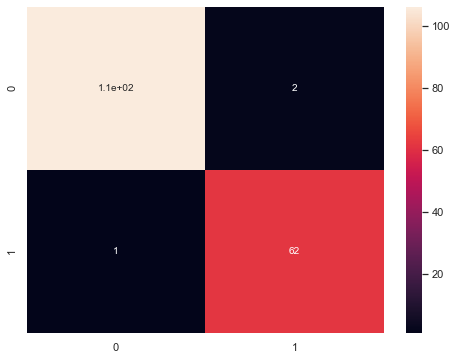

In [47]:
parameters = {'degree':np.arange(1,20,1)}
svm_pca=SVC(gamma='scale', class_weight='balanced')
clf = GridSearchCV(svm_pca, parameters)
clf.fit(fv_train_pca,etiq_train)
svm_pca=SVC(**clf.best_params_)
svm_pca.fit(fv_train_pca,etiq_train)
ysvm_pca=svm_pca.predict(fv_test_pca)
print("Taux de précision SVM lors des tests : ",metrics.accuracy_score(etiq_test, ysvm_pca))
print("F1-score SVM lors des tests : ",metrics.f1_score(etiq_test, ysvm_pca, average='weighted'))

plt.figure(figsize=(8,6))
sns.heatmap(metrics.confusion_matrix(etiq_test, ysvm_pca), annot=True, annot_kws={"size": 10})

### d) MLP

Taux de précision MLP lors des tests :  0.9824561403508771
F1-score MLP lors des tests :  0.9824263885520251


<AxesSubplot:>

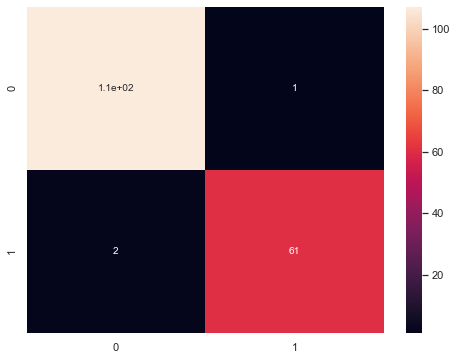

In [53]:
mlp_pca = MLPClassifier(solver='lbfgs', alpha=1e-4, activation='tanh', max_iter = 1000 , hidden_layer_sizes=(70,70,), random_state=0).fit(fv_train_pca,etiq_train)
ymlp_pca = mlp_pca.predict(fv_test_pca)
print("Taux de précision MLP lors des tests : ",metrics.accuracy_score(etiq_test, ymlp_pca))
print("F1-score MLP lors des tests : ",metrics.f1_score(etiq_test, ymlp_pca, average='weighted'))

plt.figure(figsize=(8,6))
sns.heatmap(metrics.confusion_matrix(etiq_test, ymlp_pca), annot=True, annot_kws={"size": 10})

On met côte à côté les résultats retrouvés

Text(0.5, 1.0, 'Avec le MLP')

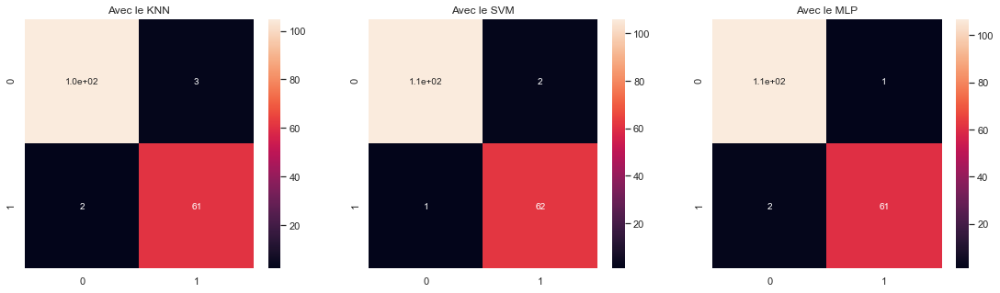

In [54]:
plt.figure(figsize=(19,5))
plt.title("Matrices de confusion avec PCA")
plt.subplot(1,3,1)
sns.heatmap(metrics.confusion_matrix(etiq_test, yknn_pca), annot=True, annot_kws={"size": 10})
plt.title("Avec le KNN")
plt.subplot(1,3,2)
sns.heatmap(metrics.confusion_matrix(etiq_test, ysvm_pca), annot=True, annot_kws={"size": 10})
plt.title("Avec le SVM")
plt.subplot(1,3,3)
sns.heatmap(metrics.confusion_matrix(etiq_test, ymlp_pca), annot=True, annot_kws={"size": 10})
plt.title("Avec le MLP")

## 3. Sélection de paramètres
### a) Sélection de paramètres embarquée (Random Forrest)

In [79]:
forrest = RandomForestClassifier(n_estimators = 700, max_features = 'sqrt', criterion = 'entropy', class_weight='balanced', random_state = 10).fit(fv_train,etiq_train)
yforrest = forrest.predict(fv_test)
print("Taux de précision lors des tests : ",metrics.accuracy_score(etiq_test, yforrest))
print("F1-score lors des tests : ",metrics.f1_score(etiq_test, yforrest, average='weighted'))

Taux de précision lors des tests :  0.9824561403508771
F1-score lors des tests :  0.9824263885520251


<AxesSubplot:>

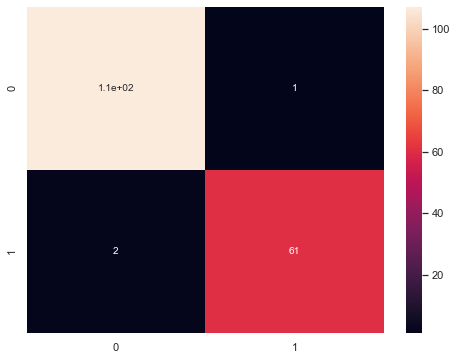

In [80]:
plt.figure(figsize=(8,6))
sns.heatmap(metrics.confusion_matrix(etiq_test, yforrest), annot=True, annot_kws={"size": 10})

On retrouve alors avec ce simple algorithme sans passer par une analyse en composante principale les même résultats, donc un résultat quasiment parfait, on voit en fusionnant les deux méthodes les résultats qu'on peut avoir

Taux de précision lors des tests :  0.9707602339181286
F1-score lors des tests :  0.970603923775359


<AxesSubplot:>

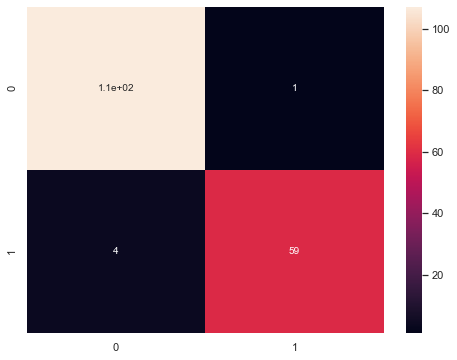

In [82]:
forrest_pca = RandomForestClassifier(n_estimators = 400, max_features = 'sqrt', criterion = 'entropy', class_weight='balanced', random_state = 10).fit(fv_train_pca,etiq_train)
yforrest_pca = forrest_pca.predict(fv_test_pca)
print("Taux de précision lors des tests : ",metrics.accuracy_score(etiq_test, yforrest_pca))
print("F1-score lors des tests : ",metrics.f1_score(etiq_test, yforrest_pca, average='weighted'))

plt.figure(figsize=(8,6))
sns.heatmap(metrics.confusion_matrix(etiq_test, yforrest_pca), annot=True, annot_kws={"size": 10})

On voit bien qu'on a de très bons résultats mais néanmoins inférieurs à leurs utilisations indépendantes
### b) Sélection de paramètres statistiques
Etant un problème de classification on utilisera les 3 méthodes suivantes de sélection de paramètres : 
1) Test du chi carré
2) L'information mutuelle
3) Estimation ANOVA
#### i. Test du chi carré
On va prendre les K meilleurs paramètres, on choisit K=7 pour permettre une comparaison avec la PCA

In [86]:
data_cancer_chi2 = SelectKBest(chi2, k=7).fit_transform(data_cancer_features,etiq)
data_cancer_chi2 = pd.DataFrame(data_cancer_chi2)
data_cancer_chi2

,0,1,2,3,4,5,6
0,17.99,122.80,1001.0,153.40,25.380,184.60,2019.0
1,20.57,132.90,1326.0,74.08,24.990,158.80,1956.0
2,19.69,130.00,1203.0,94.03,23.570,152.50,1709.0
3,11.42,77.58,386.1,27.23,14.910,98.87,567.7
4,20.29,135.10,1297.0,94.44,22.540,152.20,1575.0
...,...,...,...,...,...,...,...
564,21.56,142.00,1479.0,158.70,25.450,166.10,2027.0
565,20.13,131.20,1261.0,99.04,23.690,155.00,1731.0
566,16.60,108.30,858.1,48.55,18.980,126.70,1124.0
567,20.60,140.10,1265.0,86.22,25.740,184.60,1821.0


On peut dessiner la corrélation entre ces variables et ensuite passer à la classification utiliser les mêmes modèles que précédemment

Text(0.5, 1.0, "Matrice d'autocorrélation des données")

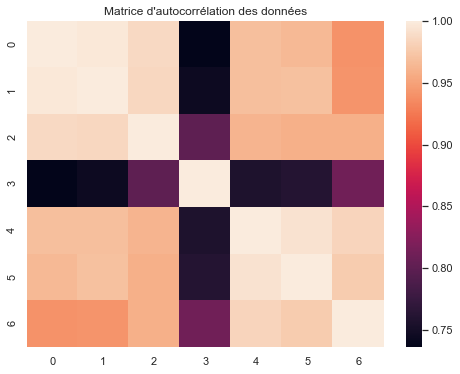

In [87]:
plt.figure(figsize=(8,6))
sns.heatmap(data_cancer_chi2.corr())
plt.title("Matrice d'autocorrélation des données")

In [88]:
fv_train_chi2, fv_test_chi2, etiq_train, etiq_test = train_test_split(data_cancer_chi2, etiq, test_size=0.3,random_state=23)

Taux de précision KNN lors des tests :  0.9415204678362573
F1-score KNN lors des tests :  0.9410934190916933
Taux de précision SVM lors des tests :  0.9415204678362573
F1-score SVM lors des tests :  0.9405823881738243


C:\Users\pc\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:500: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Taux de précision MLP lors des tests :  0.9181286549707602
F1-score MLP lors des tests :  0.9181286549707602


Text(0.5, 1.0, 'Avec le MLP')

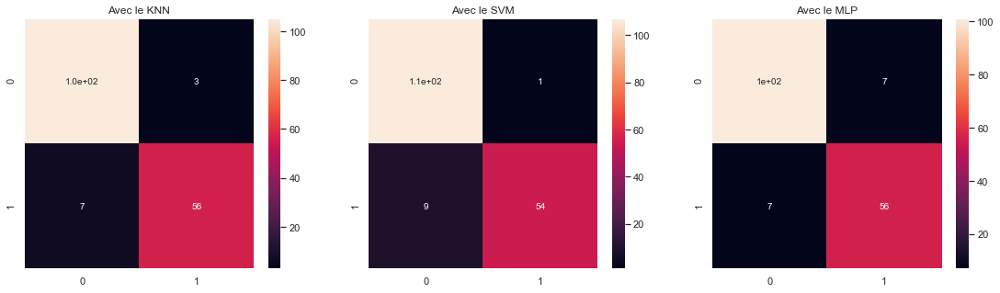

In [92]:
parameters = {'n_neighbors':np.arange(1,20,1), 'p' : np.arange(1,3,1)}
knn_chi2=KNeighborsClassifier()
clf = GridSearchCV(knn_chi2, parameters)
clf.fit(fv_train_chi2,etiq_train)
knn_chi2=KNeighborsClassifier(**clf.best_params_)
knn_chi2.fit(fv_train_chi2,etiq_train)
yknn_chi2=knn_chi2.predict(fv_test_chi2)
print("Taux de précision KNN lors des tests : ",metrics.accuracy_score(etiq_test, yknn_chi2))
print("F1-score KNN lors des tests : ", metrics.f1_score(etiq_test, yknn_chi2, average='weighted'))

parameters = {'degree':np.arange(1,20,1)}
svm_chi2=SVC(gamma='scale', class_weight='balanced')
clf = GridSearchCV(svm_chi2, parameters)
clf.fit(fv_train_chi2,etiq_train)
svm_chi2=SVC(**clf.best_params_)
svm_chi2.fit(fv_train_chi2,etiq_train)
ysvm_chi2=svm_chi2.predict(fv_test_chi2)
print("Taux de précision SVM lors des tests : ",metrics.accuracy_score(etiq_test, ysvm_chi2))
print("F1-score SVM lors des tests : ",metrics.f1_score(etiq_test, ysvm_chi2, average='weighted'))

mlp_chi2 = MLPClassifier(solver='lbfgs', alpha=1e-4, activation='tanh', max_iter = 1000 , hidden_layer_sizes=(70,70,), random_state=0).fit(fv_train_chi2,etiq_train)
ymlp_chi2 = mlp_chi2.predict(fv_test_chi2)
print("Taux de précision MLP lors des tests : ",metrics.accuracy_score(etiq_test, ymlp_chi2))
print("F1-score MLP lors des tests : ",metrics.f1_score(etiq_test, ymlp_chi2, average='weighted'))

plt.figure(figsize=(19,5))
plt.title("Matrices de confusion avec test chi 2")
plt.subplot(1,3,1)
sns.heatmap(metrics.confusion_matrix(etiq_test, yknn_chi2), annot=True, annot_kws={"size": 10})
plt.title("Avec le KNN")
plt.subplot(1,3,2)
sns.heatmap(metrics.confusion_matrix(etiq_test, ysvm_chi2), annot=True, annot_kws={"size": 10})
plt.title("Avec le SVM")
plt.subplot(1,3,3)
sns.heatmap(metrics.confusion_matrix(etiq_test, ymlp_chi2), annot=True, annot_kws={"size": 10})
plt.title("Avec le MLP")

On voit bien qu'à nombre de paramètre égal à la PCA, on a d'assez bon résulats mais ca n'améliore en aucun cas par rapport à la qualité de classification avec les paramètres initiaux, pour le réseau de neurones multicouches ça diminue de la qualité de classification
#### ii. L'information mutuelle 
Même principe on prendra les K meilleurs suivant l'information mutuelle

In [94]:
data_cancer_mutual = SelectKBest(mutual_info_classif, k=7).fit_transform(data_cancer_features,etiq)
data_cancer_mutual = pd.DataFrame(data_cancer_mutual)
data_cancer_mutual

,0,1,2,3,4,5,6
0,122.80,0.30010,0.14710,25.380,184.60,2019.0,0.2654
1,132.90,0.08690,0.07017,24.990,158.80,1956.0,0.1860
2,130.00,0.19740,0.12790,23.570,152.50,1709.0,0.2430
3,77.58,0.24140,0.10520,14.910,98.87,567.7,0.2575
4,135.10,0.19800,0.10430,22.540,152.20,1575.0,0.1625
...,...,...,...,...,...,...,...
564,142.00,0.24390,0.13890,25.450,166.10,2027.0,0.2216
565,131.20,0.14400,0.09791,23.690,155.00,1731.0,0.1628
566,108.30,0.09251,0.05302,18.980,126.70,1124.0,0.1418
567,140.10,0.35140,0.15200,25.740,184.60,1821.0,0.2650


Text(0.5, 1.0, "Matrice d'autocorrélation des données")

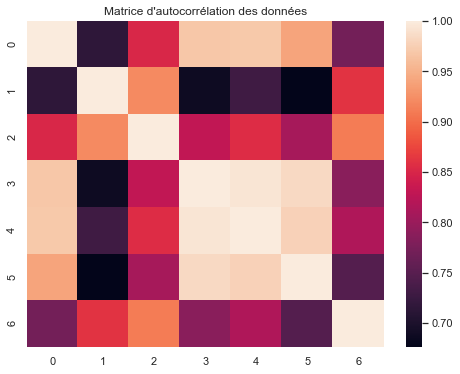

In [95]:
plt.figure(figsize=(8,6))
sns.heatmap(data_cancer_mutual.corr())
plt.title("Matrice d'autocorrélation des données")

In [96]:
fv_train_mutual, fv_test_mutual, etiq_train, etiq_test = train_test_split(data_cancer_mutual, etiq, test_size=0.3,random_state=23)

Taux de précision KNN lors des tests :  0.9064327485380117
F1-score KNN lors des tests :  0.906107381504961
Taux de précision SVM lors des tests :  0.9415204678362573
F1-score SVM lors des tests :  0.9408487434803224


C:\Users\pc\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:500: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Taux de précision MLP lors des tests :  0.9649122807017544
F1-score MLP lors des tests :  0.9647902680643603


Text(0.5, 1.0, 'Avec le MLP')

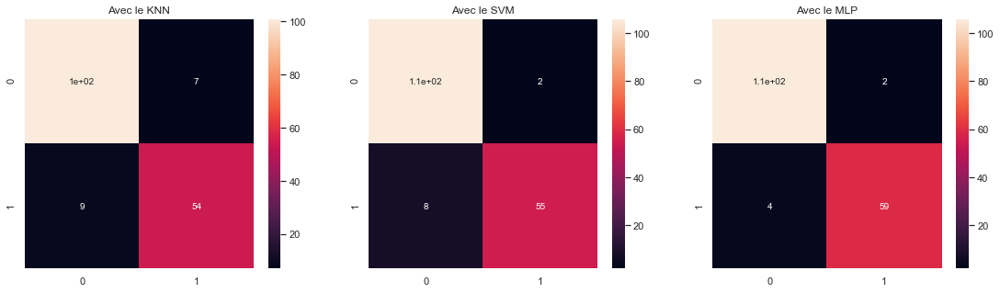

In [97]:
parameters = {'n_neighbors':np.arange(1,20,1), 'p' : np.arange(1,3,1)}
knn_mutual=KNeighborsClassifier()
clf = GridSearchCV(knn_mutual, parameters)
clf.fit(fv_train_mutual,etiq_train)
knn_mutual=KNeighborsClassifier(**clf.best_params_)
knn_mutual.fit(fv_train_mutual,etiq_train)
yknn_mutual=knn_mutual.predict(fv_test_mutual)
print("Taux de précision KNN lors des tests : ",metrics.accuracy_score(etiq_test, yknn_mutual))
print("F1-score KNN lors des tests : ", metrics.f1_score(etiq_test, yknn_mutual, average='weighted'))

parameters = {'degree':np.arange(1,20,1)}
svm_mutual=SVC(gamma='scale', class_weight='balanced')
clf = GridSearchCV(svm_mutual, parameters)
clf.fit(fv_train_mutual,etiq_train)
svm_mutual=SVC(**clf.best_params_)
svm_mutual.fit(fv_train_mutual,etiq_train)
ysvm_mutual=svm_mutual.predict(fv_test_mutual)
print("Taux de précision SVM lors des tests : ",metrics.accuracy_score(etiq_test, ysvm_mutual))
print("F1-score SVM lors des tests : ",metrics.f1_score(etiq_test, ysvm_mutual, average='weighted'))

mlp_mutual = MLPClassifier(solver='lbfgs', alpha=1e-4, activation='tanh', max_iter = 1000 , hidden_layer_sizes=(70,70,), random_state=0).fit(fv_train_mutual,etiq_train)
ymlp_mutual = mlp_mutual.predict(fv_test_mutual)
print("Taux de précision MLP lors des tests : ",metrics.accuracy_score(etiq_test, ymlp_mutual))
print("F1-score MLP lors des tests : ",metrics.f1_score(etiq_test, ymlp_mutual, average='weighted'))

plt.figure(figsize=(19,5))
plt.title("Matrices de confusion avec test de l'information mutuelle")
plt.subplot(1,3,1)
sns.heatmap(metrics.confusion_matrix(etiq_test, yknn_mutual), annot=True, annot_kws={"size": 10})
plt.title("Avec le KNN")
plt.subplot(1,3,2)
sns.heatmap(metrics.confusion_matrix(etiq_test, ysvm_mutual), annot=True, annot_kws={"size": 10})
plt.title("Avec le SVM")
plt.subplot(1,3,3)
sns.heatmap(metrics.confusion_matrix(etiq_test, ymlp_mutual), annot=True, annot_kws={"size": 10})
plt.title("Avec le MLP")

On voit bien que par rapport au test chi carré, l'information mutuelle a ses avantages et a ses inconvéniants, améliorant les performances d'un modèle et diminuant de la qualité d'un autre et donc cela montre que tout dépend la situation qu'on a. 
#### iii. ANOVA

In [98]:
data_cancer_f = SelectKBest(f_classif, k=7).fit_transform(data_cancer_features,etiq)
data_cancer_f = pd.DataFrame(data_cancer_f)
data_cancer_f

,0,1,2,3,4,5,6
0,17.99,122.80,0.14710,25.380,184.60,2019.0,0.2654
1,20.57,132.90,0.07017,24.990,158.80,1956.0,0.1860
2,19.69,130.00,0.12790,23.570,152.50,1709.0,0.2430
3,11.42,77.58,0.10520,14.910,98.87,567.7,0.2575
4,20.29,135.10,0.10430,22.540,152.20,1575.0,0.1625
...,...,...,...,...,...,...,...
564,21.56,142.00,0.13890,25.450,166.10,2027.0,0.2216
565,20.13,131.20,0.09791,23.690,155.00,1731.0,0.1628
566,16.60,108.30,0.05302,18.980,126.70,1124.0,0.1418
567,20.60,140.10,0.15200,25.740,184.60,1821.0,0.2650


Text(0.5, 1.0, "Matrice d'autocorrélation des données")

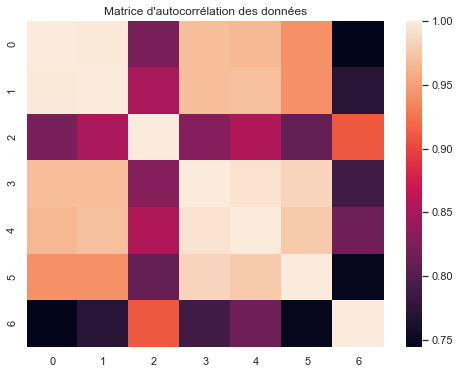

In [100]:
plt.figure(figsize=(8,6))
sns.heatmap(data_cancer_f.corr())
plt.title("Matrice d'autocorrélation des données")

In [101]:
fv_train_f, fv_test_f, etiq_train, etiq_test = train_test_split(data_cancer_f, etiq, test_size=0.3,random_state=23)

Taux de précision KNN lors des tests :  0.9122807017543859
F1-score KNN lors des tests :  0.9118117713260765
Taux de précision SVM lors des tests :  0.9415204678362573
F1-score SVM lors des tests :  0.9408487434803224


C:\Users\pc\anaconda3\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:500: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Taux de précision MLP lors des tests :  0.9532163742690059
F1-score MLP lors des tests :  0.9533632562715197


Text(0.5, 1.0, 'Avec le MLP')

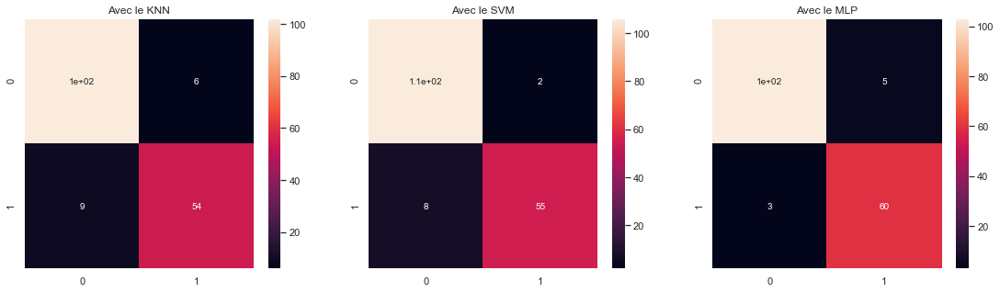

In [102]:
parameters = {'n_neighbors':np.arange(1,20,1), 'p' : np.arange(1,3,1)}
knn_f=KNeighborsClassifier()
clf = GridSearchCV(knn_f, parameters)
clf.fit(fv_train_f,etiq_train)
knn_f=KNeighborsClassifier(**clf.best_params_)
knn_f.fit(fv_train_f,etiq_train)
yknn_f=knn_f.predict(fv_test_f)
print("Taux de précision KNN lors des tests : ",metrics.accuracy_score(etiq_test, yknn_f))
print("F1-score KNN lors des tests : ", metrics.f1_score(etiq_test, yknn_f, average='weighted'))

parameters = {'degree':np.arange(1,20,1)}
svm_f=SVC(gamma='scale', class_weight='balanced')
clf = GridSearchCV(svm_f, parameters)
clf.fit(fv_train_f,etiq_train)
svm_f=SVC(**clf.best_params_)
svm_f.fit(fv_train_f,etiq_train)
ysvm_f=svm_f.predict(fv_test_f)
print("Taux de précision SVM lors des tests : ",metrics.accuracy_score(etiq_test, ysvm_f))
print("F1-score SVM lors des tests : ",metrics.f1_score(etiq_test, ysvm_f, average='weighted'))

mlp_f = MLPClassifier(solver='lbfgs', alpha=1e-4, activation='tanh', max_iter = 1000 , hidden_layer_sizes=(70,70,), random_state=0).fit(fv_train_f,etiq_train)
ymlp_f = mlp_f.predict(fv_test_f)
print("Taux de précision MLP lors des tests : ",metrics.accuracy_score(etiq_test, ymlp_f))
print("F1-score MLP lors des tests : ",metrics.f1_score(etiq_test, ymlp_f, average='weighted'))

plt.figure(figsize=(19,5))
plt.title("Matrices de confusion avec test ANOVA")
plt.subplot(1,3,1)
sns.heatmap(metrics.confusion_matrix(etiq_test, yknn_f), annot=True, annot_kws={"size": 10})
plt.title("Avec le KNN")
plt.subplot(1,3,2)
sns.heatmap(metrics.confusion_matrix(etiq_test, ysvm_f), annot=True, annot_kws={"size": 10})
plt.title("Avec le SVM")
plt.subplot(1,3,3)
sns.heatmap(metrics.confusion_matrix(etiq_test, ymlp_f), annot=True, annot_kws={"size": 10})
plt.title("Avec le MLP")